In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
!nvidia-smi

Mon Aug 18 20:04:38 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P8              9W /   70W |       1MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 16.6 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 71.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 63.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 19.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.0 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 74.4 MB/s eta 0:00:00:00:0100:01
  Attempting unins

In [4]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.180 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6411.4/8062.4 GB disk)


In [5]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="dzZEOQuovIy0ctNJW33A")
project = rf.workspace("research-on-plant-disease").project("plant-disease-detection-4htzn-ciqla")
version = project.version(1)
dataset = version.download("yolov11")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.6/88.6 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 35.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 60.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 98.0 MB/s eta 0:00:00:00:01
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.8.0 requires google-cloud-bigquery-sto


Extracting Dataset Version Zip to plant-disease-detection-1 in yolov11:: 100%|██████████| 27396/27396 [00:03<00:00, 8151.24it/s] 


In [6]:
dataset.location

'/kaggle/working/plant-disease-detection-1'

In [7]:
!yolo train task=detect data=/kaggle/working/plant-disease-detection-1/data.yaml model=yolo11x.pt epochs=50 imgsz=640 batch=24 device=0,1 patience=10 close_mosaic=10 project=/kaggle/working/content/runs name=plant_disease_v1_t4x2 workers=4

Ultralytics 8.3.180 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
                                                        CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=24, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/plant-disease-detection-1/data.yaml, degrees=0.0, deterministic=True, device=0,1, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11x.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=plant_disease_v1_t4x2, nbs=64, nms=False, opset

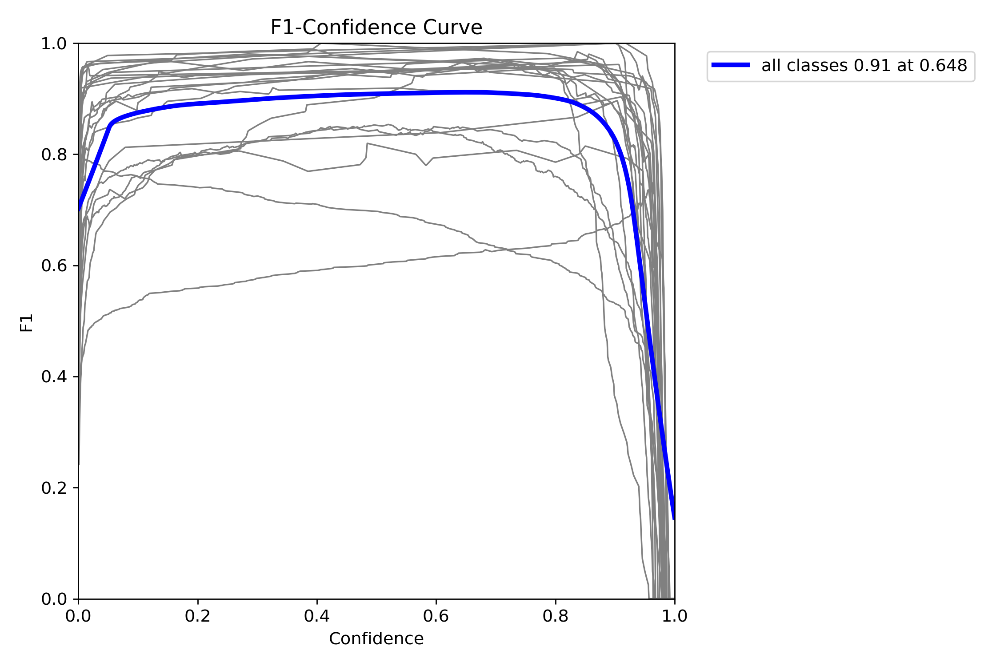

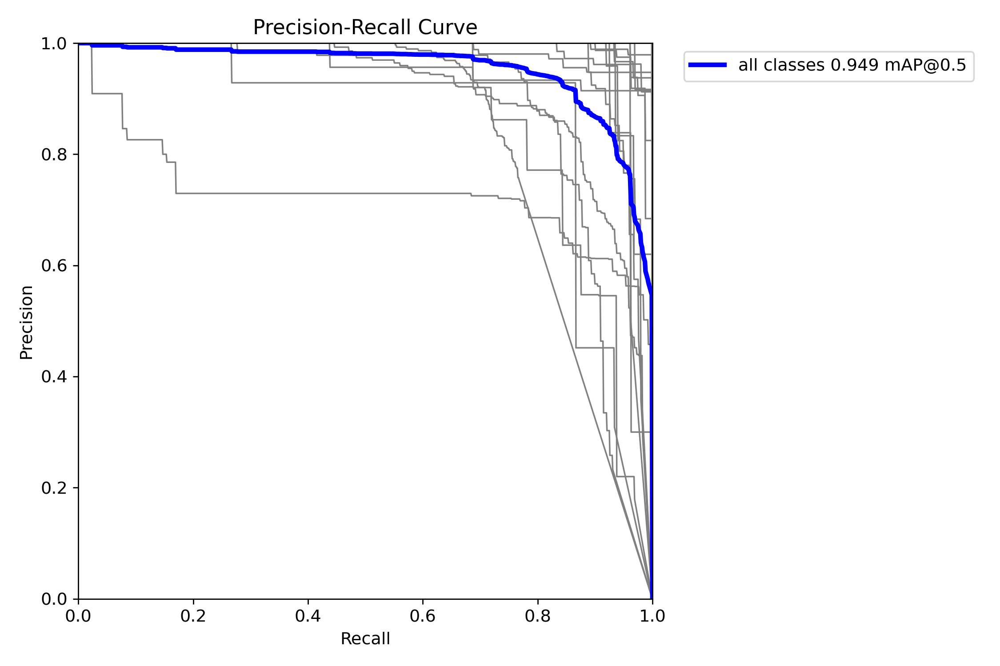

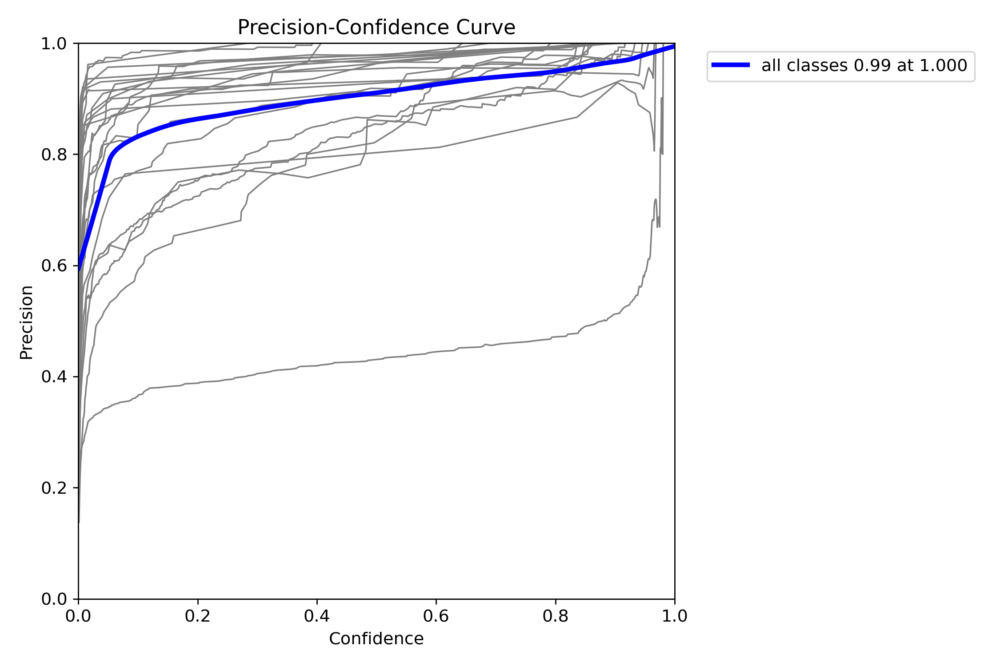

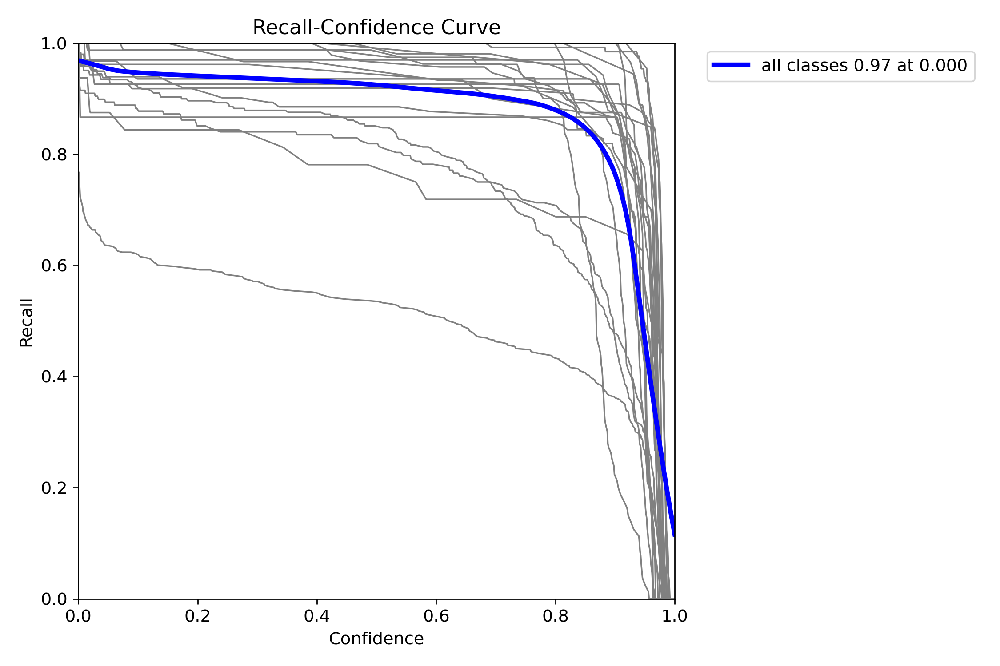

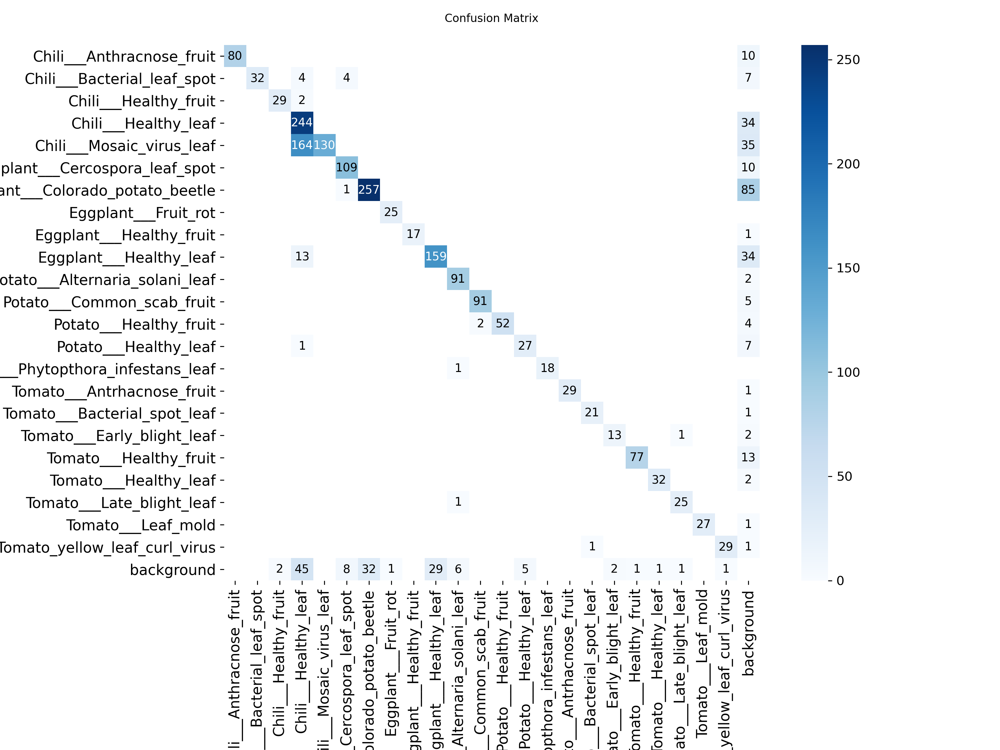

...

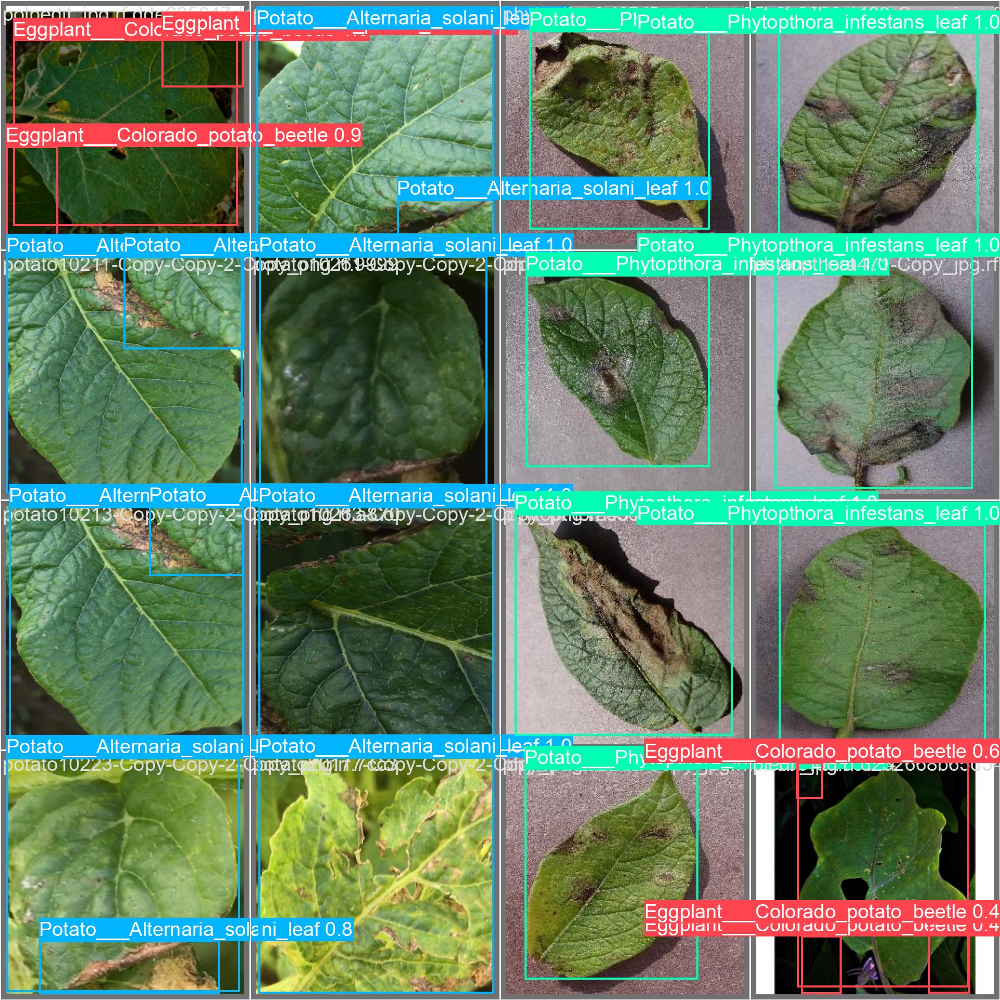

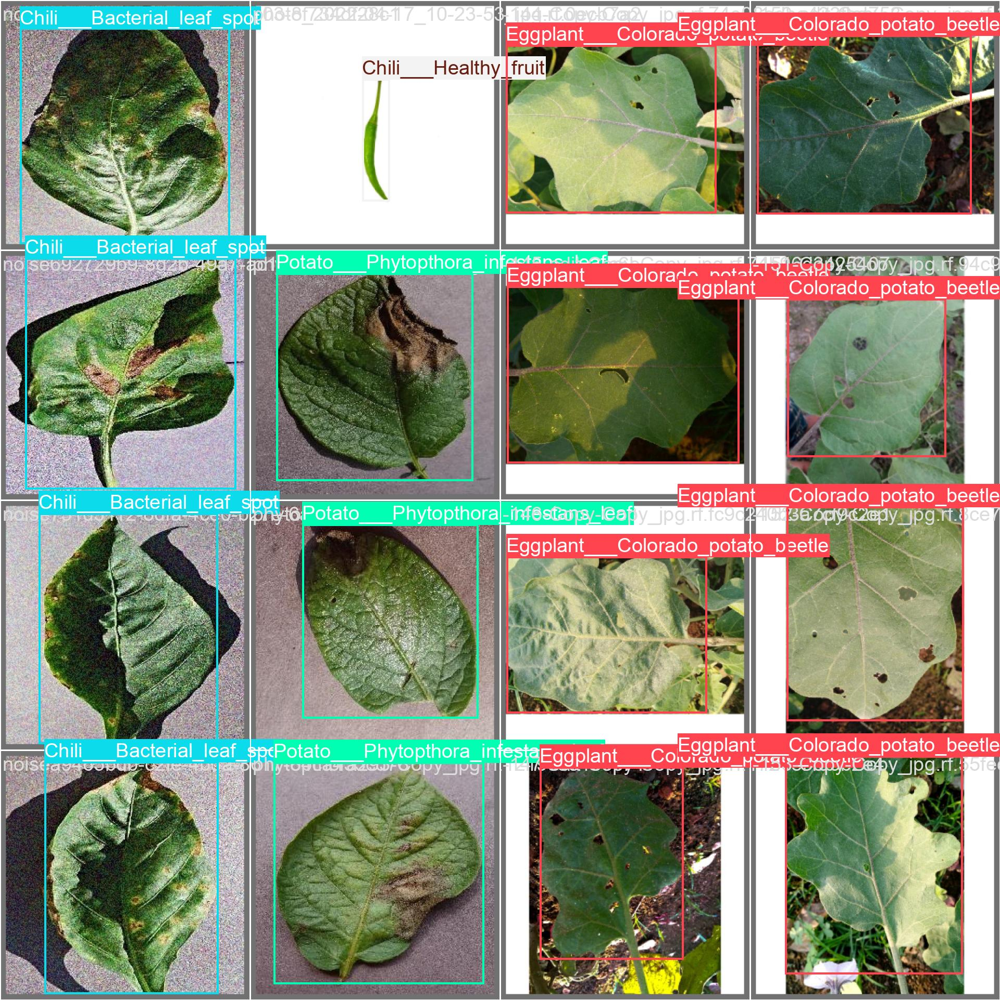

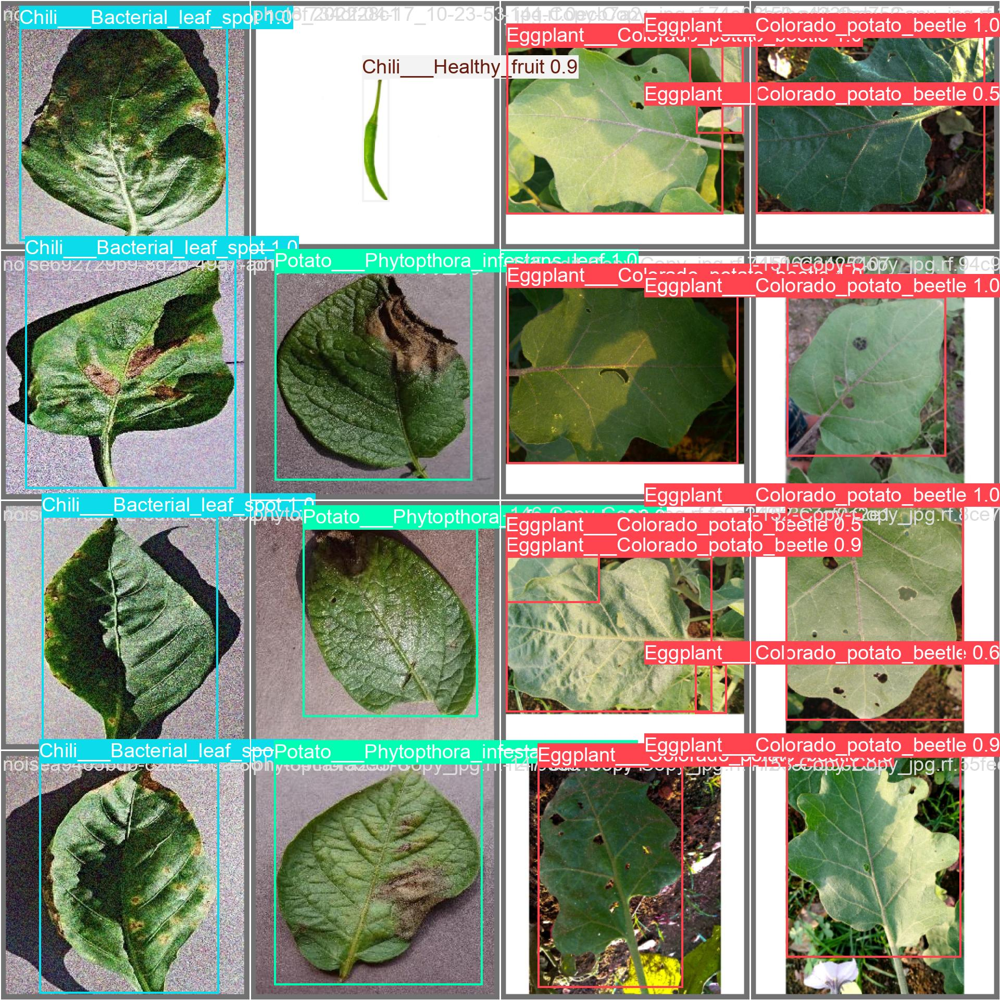

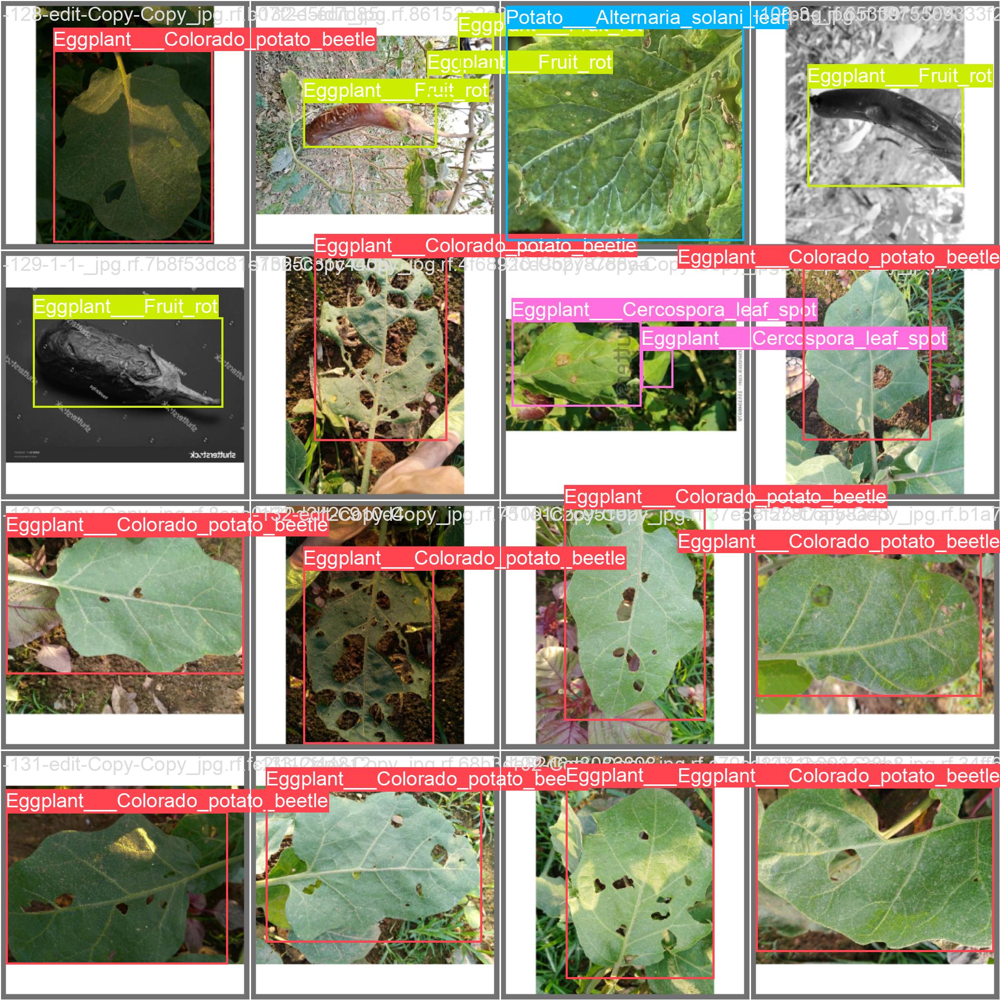

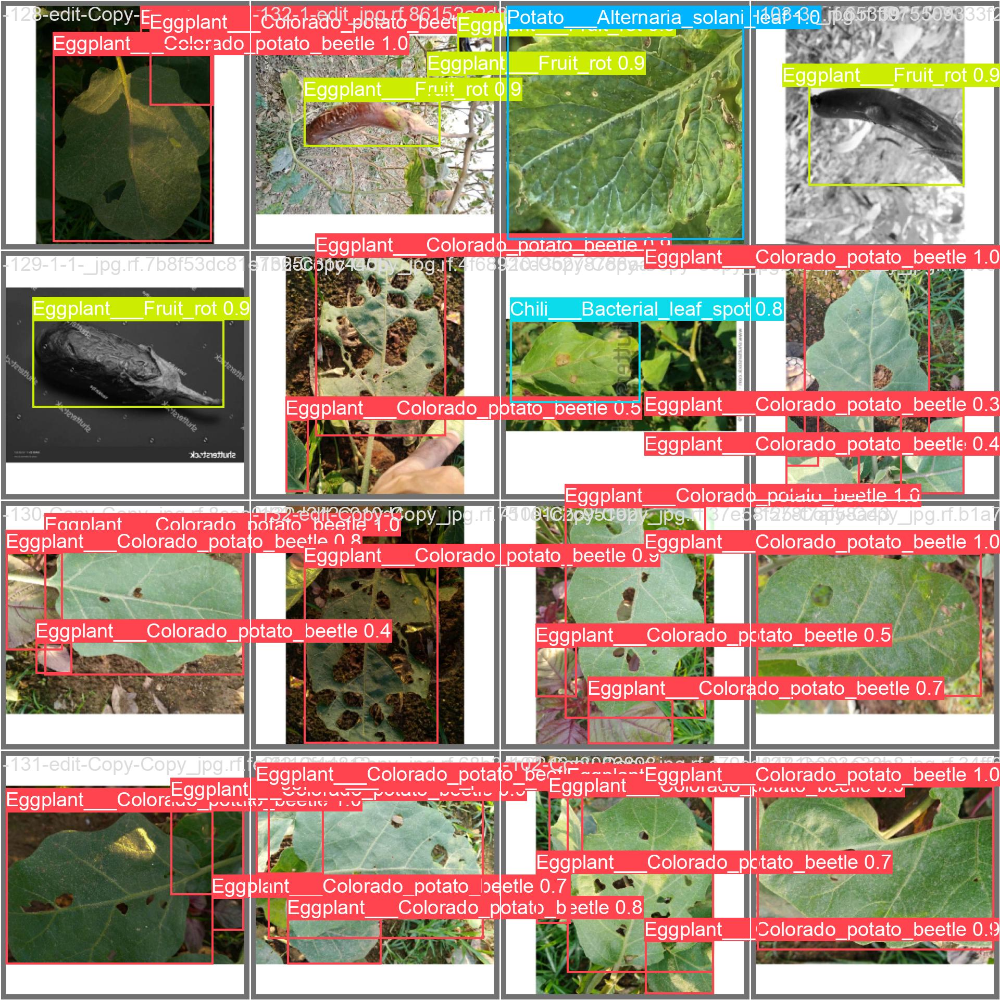

In [8]:
import os
from IPython.display import Image, display

folder_path = "/kaggle/working/content/runs/plant_disease_v1_t4x2"

# Loop through all files in the folder
for file in sorted(os.listdir(folder_path)):
    if file.lower().endswith((".png", ".jpg", ".jpeg")):  # image formats
        display(Image(filename=os.path.join(folder_path, file), width=800))

In [9]:
!yolo task=detect mode=val model=/kaggle/working/content/runs/plant_disease_v1_t4x2/weights/best.pt data=/kaggle/working/plant-disease-detection-1/data.yaml

Ultralytics 8.3.180 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11x summary (fused): 190 layers, 56,853,589 parameters, 0 gradients, 194.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1082.0±446.0 MB/s, size: 42.5 KB)
val: Scanning /kaggle/working/plant-disease-detection-1/valid/labels.cache... 12
                 Class     Images  Instances      Box(P          R      mAP50  m
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
                   all       1213       1943      0.934      0.909      0.949      0.885
Chili___Anthracnose_fruit         27         80       0.95      0.963       0.99      0.744
Chili___Bacterial_leaf_spot         28         32      0.899          1      0.962      0.923
 Chili___Healthy_fruit         29         

In [11]:
!yolo task=detect mode=predict model=/kaggle/working/content/runs/plant_disease_v1_t4x2/weights/best.pt conf=0.25 source="/kaggle/working/plant-disease-detection-1/test/images" save=True

Ultralytics 8.3.180 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11x summary (fused): 190 layers, 56,853,589 parameters, 0 gradients, 194.5 GFLOPs

image 1/1195 /kaggle/working/plant-disease-detection-1/test/images/-105-1-Copy_jpg.rf.9b63e78bb678ac98a7f104e35a76012a.jpg: 640x640 1 Eggplant___Fruit_rot, 93.2ms
image 2/1195 /kaggle/working/plant-disease-detection-1/test/images/-109-Copy_jpg.rf.0b35025a88828e617ad045c2d29d3f5e.jpg: 640x640 1 Eggplant___Fruit_rot, 68.7ms
image 3/1195 /kaggle/working/plant-disease-detection-1/test/images/-11-_jpg.rf.5b212b1c870b0ef6b690b350555437e1.jpg: 640x640 1 Eggplant___Fruit_rot, 68.7ms
image 4/1195 /kaggle/working/plant-disease-detection-1/test/images/-131-Copy-Copy_jpg.rf.7e8b02fb1325819500bf498575282a73.jpg: 640x640 3 Eggplant___Colorado_potato_beetles, 68.7ms
image 5/1195 /kaggle/working/plant-disease-detection-1/test/images/-140-edit-Copy-Copy_jpg.rf.70f82589167a4b2524c413bc16868a30.jpg: 640x640 1 Eggplant___Colorado_potato_b

In [ ]:
!zip -r /kaggle/working/working_backup.zip /kaggle/working/*

  adding: kaggle/working/content/ (stored 0%)
  adding: kaggle/working/content/runs/ (stored 0%)
  adding: kaggle/working/content/runs/plant_disease_v1_t4x2/ (stored 0%)
  adding: kaggle/working/content/runs/plant_disease_v1_t4x2/args.yaml (deflated 53%)
  adding: kaggle/working/content/runs/plant_disease_v1_t4x2/confusion_matrix_normalized.png (deflated 12%)
  adding: kaggle/working/content/runs/plant_disease_v1_t4x2/val_batch2_pred.jpg (deflated 10%)
  adding: kaggle/working/content/runs/plant_disease_v1_t4x2/val_batch0_pred.jpg (deflated 5%)
  adding: kaggle/working/content/runs/plant_disease_v1_t4x2/BoxP_curve.png (deflated 12%)
  adding: kaggle/working/content/runs/plant_disease_v1_t4x2/BoxPR_curve.png (deflated 14%)
  adding: kaggle/working/content/runs/plant_disease_v1_t4x2/train_batch18842.jpg (deflated 21%)
  adding: kaggle/working/content/runs/plant_disease_v1_t4x2/results.csv (deflated 61%)
  adding: kaggle/working/content/runs/plant_disease_v1_t4x2/results.png (deflated 8%)

In [ ]:
from IPython.display import FileLink
FileLink("/kaggle/working/working_backup.zip")